In [1]:
cd ..

/media/hjp/db6095ca-a560-4c3a-90ad-b667ec189671/REFERENCES/3D_VTO/GarmentCode/GarmentCode


In [2]:
pwd

'/media/hjp/db6095ca-a560-4c3a-90ad-b667ec189671/REFERENCES/3D_VTO/GarmentCode/GarmentCode'

In [10]:

import os 
import sys
import yaml
import json
from pprint import pprint
from glob import glob
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import cv2
import xml.etree.ElementTree as ET
from svglib.svglib import svg2rlg
from reportlab.graphics import renderPM
import pyrender

import pygarment as pyg
import open3d as o3d


import trimesh
import plotly.graph_objects as go
import PIL
from PIL import Image

    
def visualize_meshes_plotly(
    mesh_list,
    color_list=None,
    vertices_list = None,
    vertices_color_list = None,
    show_edges = True,
):
    # Pre-convert to list and load meshes once
    mesh_list = [mesh_list] if not isinstance(mesh_list, list) else mesh_list
    final_mesh_list = [trimesh.load(m) if isinstance(m, str) else m for m in mesh_list]
    
    color_list = color_list or ['lightgray'] * len(final_mesh_list)
    
    # Create all mesh traces at once
    mesh_traces = []
    edge_traces = []
    for mesh, color in zip(final_mesh_list, color_list):
        face_colors = mesh.visual.face_colors[:, :3] if hasattr(mesh.visual, 'face_colors') else None
        mesh_traces.append(go.Mesh3d(
            x=mesh.vertices[:, 0],
            y=mesh.vertices[:, 1],
            z=mesh.vertices[:, 2],
            i=mesh.faces[:, 0],
            j=mesh.faces[:, 1],
            k=mesh.faces[:, 2],
            opacity=0.5,
            facecolor=face_colors,
            color=None if face_colors is not None else color
        ))
        
        if show_edges:
            edge_x = []
            edge_y = []
            edge_z = []
            vertices = mesh.vertices
            for edge in mesh.edges:
                edge_x.extend([vertices[edge[0], 0], vertices[edge[1], 0], None])
                edge_y.extend([vertices[edge[0], 1], vertices[edge[1], 1], None])
                edge_z.extend([vertices[edge[0], 2], vertices[edge[1], 2], None])
        
            edge_traces.append(go.Scatter3d(
                x=edge_x, y=edge_y, z=edge_z,
                mode='lines',
                line=dict(
                    color = color if color is not None else 'red',
                    width=2
                ),
                name='Edges'
            ))
    
    fig = go.Figure(data = mesh_traces + edge_traces)
    

    for vertex, color in zip(vertices_list, vertices_color_list):
        fig.add_trace(go.Scatter3d(
            x=vertex[:, 0],
            y=vertex[:, 1],
            z=vertex[:, 2],
            mode='markers',
            marker=dict(size=2, color=color, opacity=1),
            name='Vertices'
        ))
    fig.update_layout(
        scene=dict(aspectmode='data'),
        width=800,
        height=800,
        showlegend=False
    )
    
    fig.show()
    

MESH_1_PATH = "./ANALYSIS/mesh_1.obj"
MESH_2_PATH = "./ANALYSIS/mesh_2.obj"

mesh_1 = trimesh.load(MESH_1_PATH)
mesh_2 = trimesh.load(MESH_2_PATH)

print("mesh_1 vertices", mesh_1.vertices.shape)
print("mesh_1 faces", mesh_1.faces.shape)
print("mesh_2 vertices", mesh_2.vertices.shape)
print("mesh_2 faces", mesh_2.faces.shape)



mesh_1 vertices (2754, 3)
mesh_1 faces (5112, 3)
mesh_2 vertices (2754, 3)
mesh_2 faces (5112, 3)


In [89]:
print(np.unique(mesh_1.vertices, axis=0).shape)
print(np.unique(mesh_2.vertices, axis=0).shape)

(2606, 3)
(2606, 3)


In [90]:
visualize_meshes_plotly(
    [mesh_1, mesh_2],
    color_list=["red", "blue"],
    # edge_list=mesh_2.edges
)

In [7]:
import numpy as np
import networkx as nx
import pandas as pd

# Input data: Replace with your actual data
vertices = np.array(mesh_2.vertices)
faces = np.array(mesh_2.faces)[0]
edges = np.array(mesh_2.edges)

# Edge length threshold
threshold = 110

# Step 1: Calculate edge lengths
edge_lengths = np.linalg.norm(vertices[edges[:, 0]] - vertices[edges[:, 1]], axis=1)

# Step 2: Filter valid edges below the threshold
valid_edges = edges[edge_lengths <= threshold]

# Step 3: Create graph and find connected components
G = nx.Graph()
G.add_edges_from(valid_edges)
components = list(nx.connected_components(G))

# Step 4: Assign labels based on connected components
labels = np.zeros(len(vertices), dtype=int)
for i, component in enumerate(components):
    for v in component:
        labels[v] = i

# Step 5: Create a segmentation map
segmentation_map = pd.DataFrame({'Vertex': range(len(vertices)), 'Label': labels})

print(sorted(segmentation_map["Label"].unique()))
# Save segmentation map to CSV
# segmentation_map.to_csv('segmentation_map.csv', index=False)

# Print output
print(segmentation_map)

[0, 1, 2, 3, 4, 5, 6, 7]
      Vertex  Label
0          0      0
1          1      0
2          2      0
3          3      0
4          4      0
...      ...    ...
2749    2749      7
2750    2750      7
2751    2751      7
2752    2752      7
2753    2753      7

[2754 rows x 2 columns]


In [17]:
mesh = mesh_1
visualize_meshes_plotly(
    [mesh],
    color_list=["gray"],
    # vertex_list=mesh.vertices[segmentation_map["Label"] == 6]
    vertices_list=[mesh.vertices[segmentation_map["Label"] == 4]],
    vertices_color_list=["red"],
    show_edges=False
)

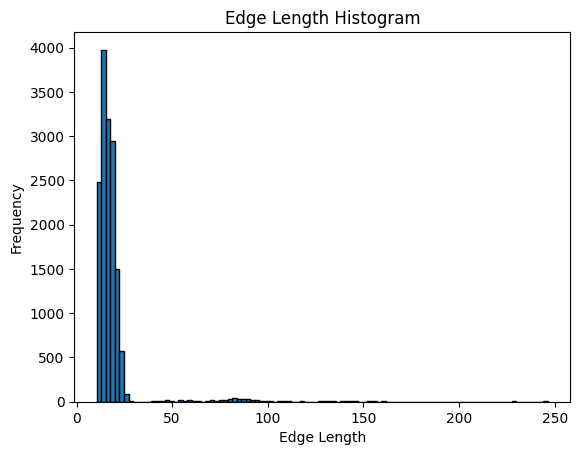

In [93]:
# Draw edge length histogram
plt.hist(edge_lengths, bins=100, edgecolor='black')
plt.xlabel('Edge Length')
plt.ylabel('Frequency')
plt.title('Edge Length Histogram')
plt.show()

In [44]:
import trimesh
import numpy as np
import networkx as nx
import pandas as pd

# Load the mesh
MESH_PATH = "./ANALYSIS/mesh_2.obj"
mesh = trimesh.load(MESH_PATH)

# Extract vertices and edges
vertices = mesh.vertices
edges = mesh.edges

# Step 1: Identify stitching vertices
# Find duplicate vertices based on position
_, unique_indices, counts = np.unique(vertices, axis=0, return_index=True, return_counts=True)
stitch_vertices = np.where(counts > 1)[0]  # Indices of stitch vertices

# Step 2: Compute edge lengths and filter by threshold
threshold = 0.1  # Set edge length threshold
edge_lengths = np.linalg.norm(vertices[edges[:, 0]] - vertices[edges[:, 1]], axis=1)
valid_edges = edges[edge_lengths <= threshold]

# Step 3: Create graph and find connected components
G = nx.Graph()
G.add_edges_from(valid_edges)
components = list(nx.connected_components(G))

# Step 4: Label vertices
labels = np.full(len(vertices), -1)  # -1 means unassigned
stitch_labels = -2  # Special label for stitch vertices

# Assign stitch vertex labels
for v in stitch_vertices:
    labels[v] = stitch_labels

# Assign panel labels to remaining vertices
panel_id = 0
for component in components:
    # Skip stitching vertices in the component
    if any(v in stitch_vertices for v in component):
        continue
    for v in component:
        labels[v] = panel_id
    panel_id += 1

# Step 5: Save segmentation map
segmentation_map = pd.DataFrame({'Vertex': range(len(vertices)), 'Label': labels})
# segmentation_map.to_csv('segmentation_map.csv', index=False)

# Print segmentation result
print(segmentation_map)

      Vertex  Label
0          0     -1
1          1     -1
2          2     -1
3          3     -1
4          4     -1
...      ...    ...
2749    2749     -1
2750    2750     -1
2751    2751     -1
2752    2752     -1
2753    2753     -1

[2754 rows x 2 columns]


In [45]:
segmentation_map["Label"].unique()

array([-1, -2])

In [53]:
visualize_meshes_plotly(
    [mesh_1],
    color_list=["gray"],
    vertex_list=mesh_1.vertices[stitch_vertices]
)

In [52]:
stitch_vertices.shape

(137,)